In [26]:
from __future__ import absolute_import, division, print_function, unicode_literals

!pip install -q tensorflow-gpu==2.0.0-beta1
import tensorflow as tf
print("GPU Available: ", tf.test.is_gpu_available())

print("Tensorflow Version: ", tf.__version__)

GPU Available:  True
Tensorflow Version:  2.0.0-beta1


In [0]:
from numpy.random import seed
seed(1)
tf.compat.v1.set_random_seed(2)

In [28]:
from skimage import io 
import tensorflow as tf
import os

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
#/content/CNRPark-Patches-150x150.zip
#!unzip "/content/Data.zip"
!unzip "/content/drive/My Drive/Patches2.zip"

Archive:  /content/drive/My Drive/Patches2.zip
   creating: Patches2/
  inflating: Patches2/.DS_Store      
   creating: __MACOSX/
   creating: __MACOSX/Patches2/
  inflating: __MACOSX/Patches2/._.DS_Store  
   creating: Patches2/busy/
  inflating: Patches2/busy/20150708_1500_7 2.jpg  
   creating: __MACOSX/Patches2/busy/
  inflating: __MACOSX/Patches2/busy/._20150708_1500_7 2.jpg  
  inflating: Patches2/busy/20150708_0940_8.jpg  
  inflating: __MACOSX/Patches2/busy/._20150708_0940_8.jpg  
  inflating: Patches2/busy/20150708_1730_25.jpg  
  inflating: __MACOSX/Patches2/busy/._20150708_1730_25.jpg  
  inflating: Patches2/busy/20150703_1000_16.jpg  
  inflating: __MACOSX/Patches2/busy/._20150703_1000_16.jpg  
  inflating: Patches2/busy/20150708_1155_2.jpg  
  inflating: __MACOSX/Patches2/busy/._20150708_1155_2.jpg  
  inflating: Patches2/busy/20150708_1030_6 2.jpg  
  inflating: __MACOSX/Patches2/busy/._20150708_1030_6 2.jpg  
  inflating: Patches2/busy/S_2016-01-18_13.10_C06_204.jpg  
 

In [29]:
print("Keras Version: ", tf.keras.__version__)
#/content/Data

Keras Version:  2.2.4-tf


In [0]:
class Configuration:
    def __init__(self):
        self.maxwidth =0
        self.maxheight=0
        self.minwidth = 35000
        self.minheight = 35000
        self.imgcount=0
        self.img_width_adjust = 480
        self.img_height_adjust= 360
        self.data_dir = "/content/Patches2"

In [0]:
config = Configuration()

In [0]:
def calculateDimension(path):
    for subdir, dirs, files in os.walk(path):
        for file in files:
            if file.endswith(".jpg"):
                config.imgcount+=1
                filename = os.path.join(subdir, file)
                image = io.imread(filename)
                width = image.shape[0]
                height = image.shape[1]
                if width < config.minwidth:
                    config.minwidth = width
                if height < config.minheight:
                    config.minheight = height
                if width > config.maxwidth:
                    config.maxwidth = width
                if height > config.maxheight:
                    config.maxheight = height
    return

In [33]:
config.data_dir

'/content/Patches2'

In [34]:
calculateDimension(config.data_dir)
print("Minimum Width:\t",config.minwidth)
print("Minimum Height:\t",config.minheight)
print("Maximum Width:\t",config.maxwidth)
print("Maximum Height:\t",config.maxheight)
print("Image Count:\t",config.imgcount)

Minimum Width:	 32
Minimum Height:	 26
Maximum Width:	 172
Maximum Height:	 150
Image Count:	 126995


In [35]:
SIZE = (150,150)
BATCH_SIZE = 64

datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255, 
    validation_split=0.2)

train_generator = datagen.flow_from_directory(
    config.data_dir,
    target_size=SIZE,
    batch_size=BATCH_SIZE, 
    subset='training',
    class_mode = 'categorical')

val_generator = datagen.flow_from_directory(
    config.data_dir,
    target_size=SIZE,
    batch_size=BATCH_SIZE, 
    subset='validation',
    class_mode = 'categorical')

Found 101597 images belonging to 2 classes.
Found 25398 images belonging to 2 classes.


In [36]:
image_batch_train, label_batch_train = next(iter(train_generator))
print("Image batch shape: ", image_batch_train.shape)
print("Label batch shape: ", label_batch_train.shape)

Image batch shape:  (64, 150, 150, 3)
Label batch shape:  (64, 2)


In [37]:
print (train_generator.class_indices)

{'busy': 0, 'free': 1}


In [0]:
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Dropout

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150,150,3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(Dropout(0.4))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(Dropout(0.4))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(Dropout(0.4))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(Dropout(0.4))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(train_generator.num_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['acc'])

In [40]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=10,
      validation_data=val_generator,
      validation_steps=50)

Epoch 1/10
100/100 [==============================] - 20s 199ms/step - loss: 0.6074 - acc: 0.7172 - val_loss: 0.4330 - val_acc: 0.8656
Epoch 2/10
100/100 [==============================] - 17s 173ms/step - loss: 0.2371 - acc: 0.9205 - val_loss: 0.2749 - val_acc: 0.8709
Epoch 3/10
100/100 [==============================] - 17s 171ms/step - loss: 0.1624 - acc: 0.9431 - val_loss: 0.2133 - val_acc: 0.9013
Epoch 4/10
100/100 [==============================] - 17s 173ms/step - loss: 0.1454 - acc: 0.9526 - val_loss: 0.1854 - val_acc: 0.9219
Epoch 5/10
100/100 [==============================] - 17s 172ms/step - loss: 0.1458 - acc: 0.9494 - val_loss: 0.1864 - val_acc: 0.9097
Epoch 6/10
100/100 [==============================] - 17s 172ms/step - loss: 0.1085 - acc: 0.9620 - val_loss: 0.1250 - val_acc: 0.9463
Epoch 7/10
100/100 [==============================] - 17s 171ms/step - loss: 0.1102 - acc: 0.9636 - val_loss: 0.1873 - val_acc: 0.9191
Epoch 8/10
100/100 [==============================] - 1

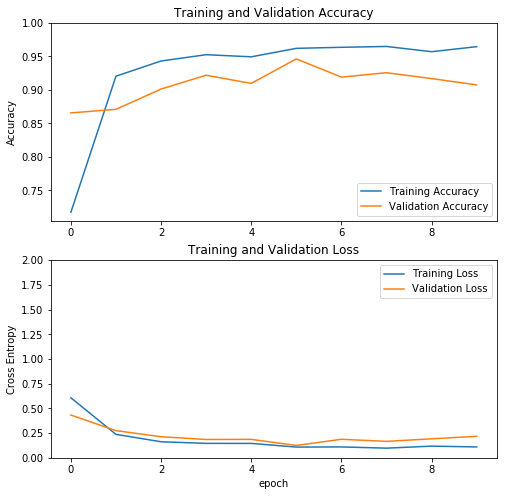

<Figure size 432x288 with 0 Axes>

In [51]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,2.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()
plt.savefig('Accuracy.jpg')

In [0]:
model.save('/content/Pklot_Empty_CNR_Dark.h5')